In [ ]:
# =============================================================================
# Library Import
# =============================================================================
import numpy as np
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.models import Model
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.callbacks import ModelCheckpoint
from keras.losses import MeanSquaredError
from keras.losses import MeanAbsoluteError
from keras.optimizers import Adam
from keras.layers import InputLayer
from keras.models import load_model
from tensorflow import keras
from keras.callbacks import ModelCheckpoint


import tensorflow as tf
import keras as ks

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR



from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# =============================================================================
# Data Import
# =============================================================================

TrainData = pd.read_csv('/content/drive/MyDrive/M2/TrainData.csv')
TestData = pd.read_csv('/content/drive/MyDrive/M2/TestData.csv')
Machine1 = pd.read_csv('/content/drive/MyDrive/M2/Machine1.csv')
Machine11 = pd.read_csv('/content/drive/MyDrive/M2/Machine11.csv')
Machine22 = pd.read_csv('/content/drive/MyDrive/M2/Machine22.csv')
Machine28 = pd.read_csv('/content/drive/MyDrive/M2/Machine28.csv')
Machine35 = pd.read_csv('/content/drive/MyDrive/M2/Machine35.csv')
Machine71 = pd.read_csv('/content/drive/MyDrive/M2/Machine71.csv')


In [ ]:
# =============================================================================
# Drop Unwanted Columns
# =============================================================================

TrainData = TrainData.drop(['datetime',
                           'model',
                           'machineID',
                           'failure',
                            'failed',
                            'error1',
                            'error2',
                            'error3',
                            'error4',
                            'error5',
                            'comp1',
                            'comp2',
                            'comp3',
                            'comp4',
                            'age',
                            ],axis=1)

TestData = TestData.drop(['datetime',
                           'model',
                           'machineID',
                           'failure',
                            'failed',
                            'error1',
                            'error2',
                            'error3',
                            'error4',
                            'error5',
                            'comp1',
                            'comp2',
                            'comp3',
                            'comp4',
                            'age',
                            #'RUL',
                            #'RULWeek',
                            #'time_in_cycles'
                            ],axis=1)

Machine1 = Machine1.drop(['datetime',
                           'model',
                           'machineID',
                           'failure',
                            'failed',
                            'error1',
                            'error2',
                            'error3',
                            'error4',
                            'error5',
                            'comp1',
                            'comp2',
                            'comp3',
                            'comp4',
                            'age',
                            ],axis=1)

Machine11 = Machine11.drop(['datetime',
                           'model',
                           'machineID',
                           'failure',
                            'failed',
                            'error1',
                            'error2',
                            'error3',
                            'error4',
                            'error5',
                            'comp1',
                            'comp2',
                            'comp3',
                            'comp4',
                            'age',
                            ],axis=1)

Machine22 = Machine22.drop(['datetime',
                           'model',
                           'machineID',
                           'failure',
                            'failed',
                            'error1',
                            'error2',
                            'error3',
                            'error4',
                            'error5',
                            'comp1',
                            'comp2',
                            'comp3',
                            'comp4',
                            'age',
                            ],axis=1)

Machine28 = Machine28.drop(['datetime',
                           'model',
                           'machineID',
                           'failure',
                            'failed',
                            'error1',
                            'error2',
                            'error3',
                            'error4',
                            'error5',
                            'comp1',
                            'comp2',
                            'comp3',
                            'comp4',
                            'age',
                            ],axis=1)

Machine35 = Machine35.drop(['datetime',
                           'model',
                           'machineID',
                           'failure',
                            'failed',
                            'error1',
                            'error2',
                            'error3',
                            'error4',
                            'error5',
                            'comp1',
                            'comp2',
                            'comp3',
                            'comp4',
                            'age',
                            ],axis=1)

Machine71 = Machine71.drop(['datetime',
                           'model',
                           'machineID',
                           'failure',
                            'failed',
                            'error1',
                            'error2',
                            'error3',
                            'error4',
                            'error5',
                            'comp1',
                            'comp2',
                            'comp3',
                            'comp4',
                            'age',
                            ],axis=1)


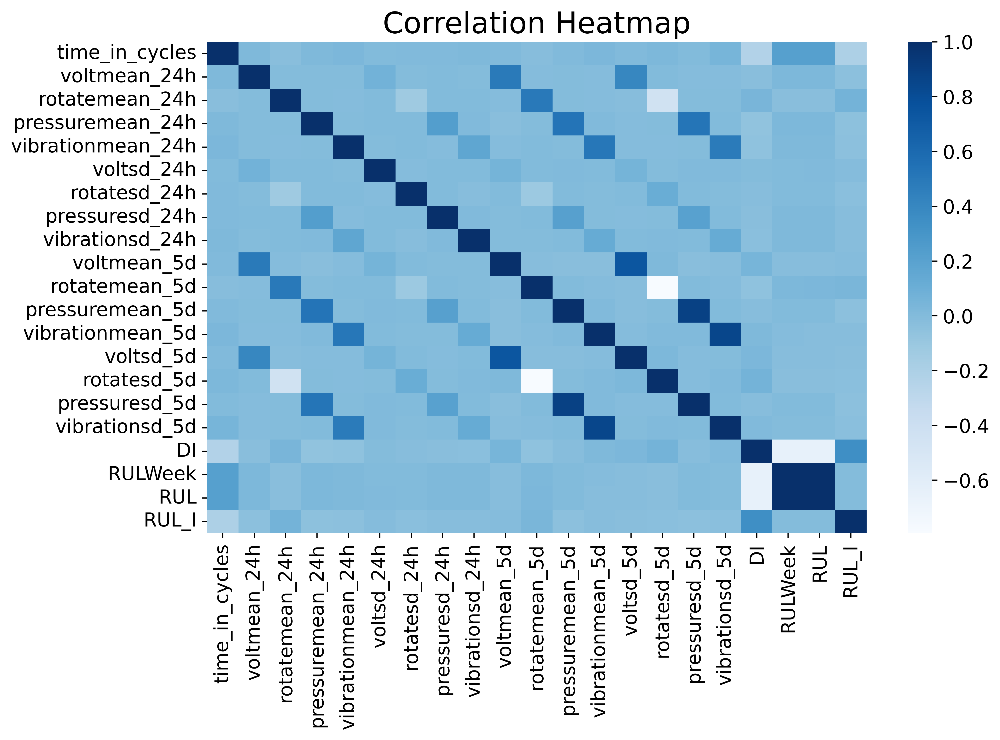

In [ ]:
# =============================================================================
# Correlation Heatmap
# =============================================================================

font = {'weight':'normal',
        'size':13}
plt.rc('font', **font)
plt.figure(figsize=(10,6),dpi=500)
dataplot=sns.heatmap(TrainData.corr(),cmap="Blues")
plt.title('Correlation Heatmap',fontsize=20)
plt.show()

In [ ]:
Machine71

,time_in_cycles,voltmean_24h,rotatemean_24h,pressuremean_24h,vibrationmean_24h,voltsd_24h,rotatesd_24h,pressuresd_24h,vibrationsd_24h,voltmean_5d,...,pressuremean_5d,vibrationmean_5d,voltsd_5d,rotatesd_5d,pressuresd_5d,vibrationsd_5d,DI,RULWeek,RUL,RUL_I
0,174,171.609410,457.229908,100.254114,37.833344,12.657108,35.969430,9.530743,5.019496,171.035812,...,111.419536,39.252927,2.335834,35.558694,11.820024,1.436208,2.576491,1,1,29
1,175,167.959717,445.056058,101.389840,39.015487,12.218261,56.424379,11.133486,5.241296,169.809303,...,111.854792,39.171069,1.898903,35.704397,11.286203,1.435629,2.442097,1,2,28
2,176,176.893103,463.371978,103.424110,38.262698,17.233358,45.648096,7.741203,5.204568,170.899002,...,108.263537,39.258304,3.741394,40.979621,10.312219,1.343818,2.314713,1,3,27
3,177,172.336662,445.250894,97.754526,39.821000,10.369460,49.639824,13.303421,4.529504,171.286277,...,102.803411,38.995338,3.776915,22.864164,5.118188,0.957750,2.193974,1,4,26
4,178,172.508462,456.061350,98.798150,39.854537,12.807818,46.541661,9.302710,5.316912,172.261471,...,100.324148,38.957413,3.179974,8.019047,2.218220,0.908315,2.079532,1,5,25
5,179,173.545503,434.545274,96.912700,39.745056,14.335358,57.781038,9.867406,4.790085,172.648689,...,99.655865,39.339756,3.198547,11.122769,2.696389,0.693914,1.971060,1,6,24
6,180,166.711209,455.905215,101.334016,40.070613,17.308468,62.254114,8.518975,4.506632,172.398988,...,99.644700,39.550781,3.670091,11.253342,2.687515,0.730139,1.868246,1,7,23
7,181,169.468402,462.218635,101.241619,40.389388,10.960819,37.767040,10.803789,5.724804,170.914048,...,99.208202,39.976119,2.794830,10.944621,2.012742,0.260746,1.770795,2,8,22
8,182,160.676830,452.442956,103.274691,39.014868,14.528134,51.838523,7.930188,4.687835,168.582081,...,100.312235,39.814892,5.167948,10.497072,2.476551,0.510374,1.678427,2,9,21
9,183,170.950484,458.501343,100.374885,39.728648,17.539639,51.739325,10.854408,4.836208,168.270485,...,100.627582,39.789714,4.912692,10.772546,2.331710,0.511034,1.590877,2,10,20


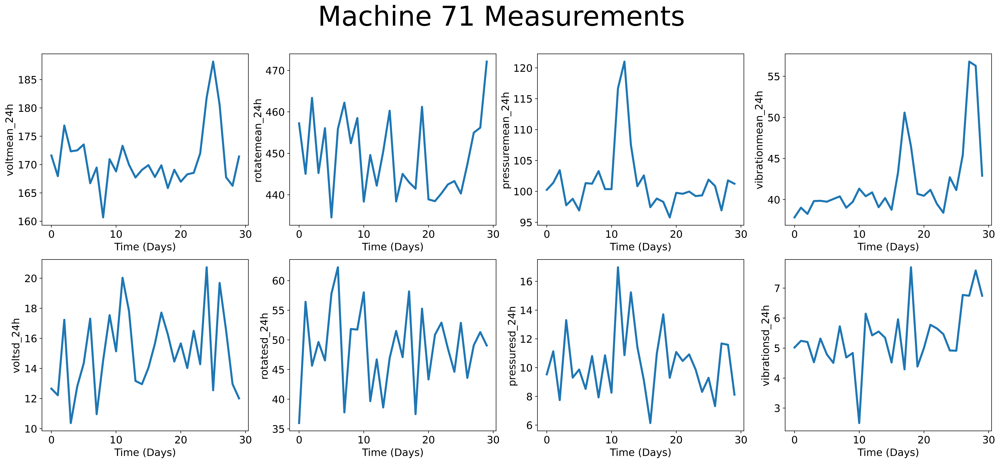

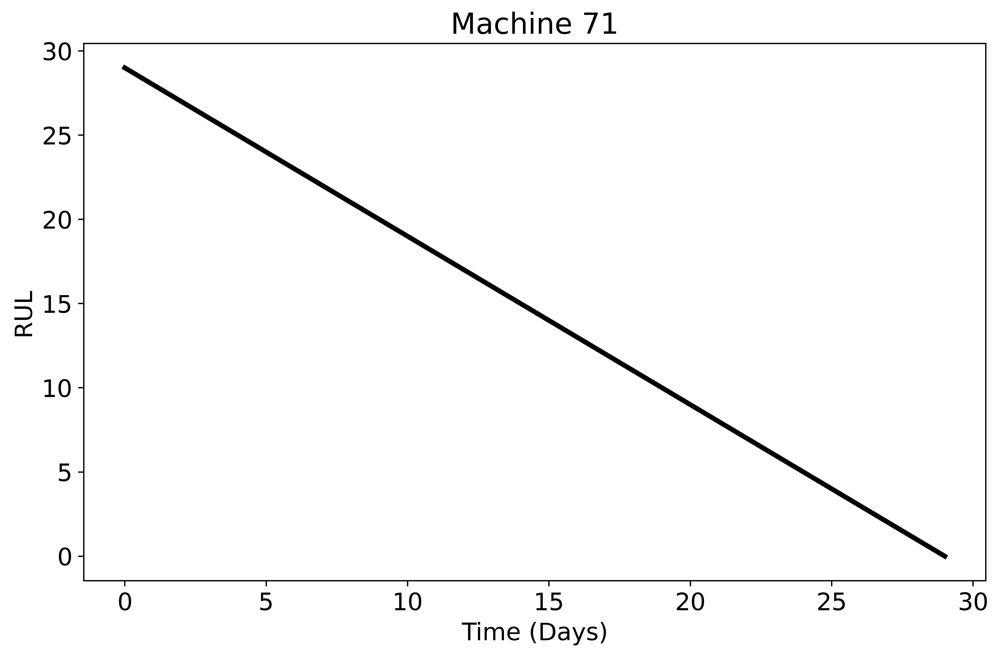

In [ ]:
# =============================================================================
# Features and Targets
# =============================================================================

font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)

plt.figure(figsize=(25,10),dpi=500)

plt.subplot(241)
plt.plot(Machine71['voltmean_24h'],linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('voltmean_24h')

plt.subplot(242)
plt.plot(Machine71['rotatemean_24h'],linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('rotatemean_24h')

plt.subplot(243)
plt.plot(Machine71['pressuremean_24h'],linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('pressuremean_24h')

plt.subplot(244)
plt.plot(Machine71['vibrationmean_24h'],linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('vibrationmean_24h')

plt.subplot(245)
plt.plot(Machine71['voltsd_24h'],linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('voltsd_24h')

plt.subplot(246)
plt.plot(Machine71['rotatesd_24h'],linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('rotatesd_24h')

plt.subplot(247)
plt.plot(Machine71['pressuresd_24h'],linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('pressuresd_24h')

plt.subplot(248)
plt.plot(Machine71['vibrationsd_24h'],linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('vibrationsd_24h')


plt.suptitle('Machine 71 Measurements', fontsize=40)
plt.show()




font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)
plt.figure(figsize=(10,6),dpi=500)
plt.plot(Machine71['RUL_I'],color='black',linewidth=3)  # Plotting the y=x line for reference
plt.title('Machine 71')
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.show()

In [ ]:
# =============================================================================
# Train & Test Data
# =============================================================================

X_train = TrainData.drop('RUL_I',axis=1)
y_train = TrainData['RUL_I']

X_test = TestData.drop('RUL_I',axis=1)
y_test = TestData['RUL_I']

X_M1 = Machine1.drop('RUL_I',axis=1)
y_M1 = Machine1['RUL_I']

X_M11 = Machine11.drop('RUL_I',axis=1)
y_M11 = Machine11['RUL_I']

X_M22 = Machine22.drop('RUL_I',axis=1)
y_M22 = Machine22['RUL_I']

X_M28 = Machine28.drop('RUL_I',axis=1)
y_M28 = Machine28['RUL_I']

X_M35 = Machine35.drop('RUL_I',axis=1)
y_M35 = Machine35['RUL_I']

X_M71 = Machine71.drop('RUL_I',axis=1)
y_M71 = Machine71['RUL_I']

Total Linear Regression MAE =  28.19182632808258
Total Linear Regression MSE = 1424.348020296317
M1 Linear Regression MAE =  20.131348749799443
M1 Linear Regression MSE = 603.0063828370295
M11 Linear Regression MAE =  53.305334021007695
M11 Linear Regression MSE = 3785.784329484597
M22 Linear Regression MAE =  24.53079321351305
M22 Linear Regression MSE = 795.9962148848374
M28 Linear Regression MAE =  35.4377880065803
M28 Linear Regression MSE = 1648.8814385921119
M35 Linear Regression MAE =  21.473444239267966
M35 Linear Regression MSE = 735.2913667301783
M71 Linear Regression MAE =  39.92889321895633
M71 Linear Regression MSE = 1696.1568576057305


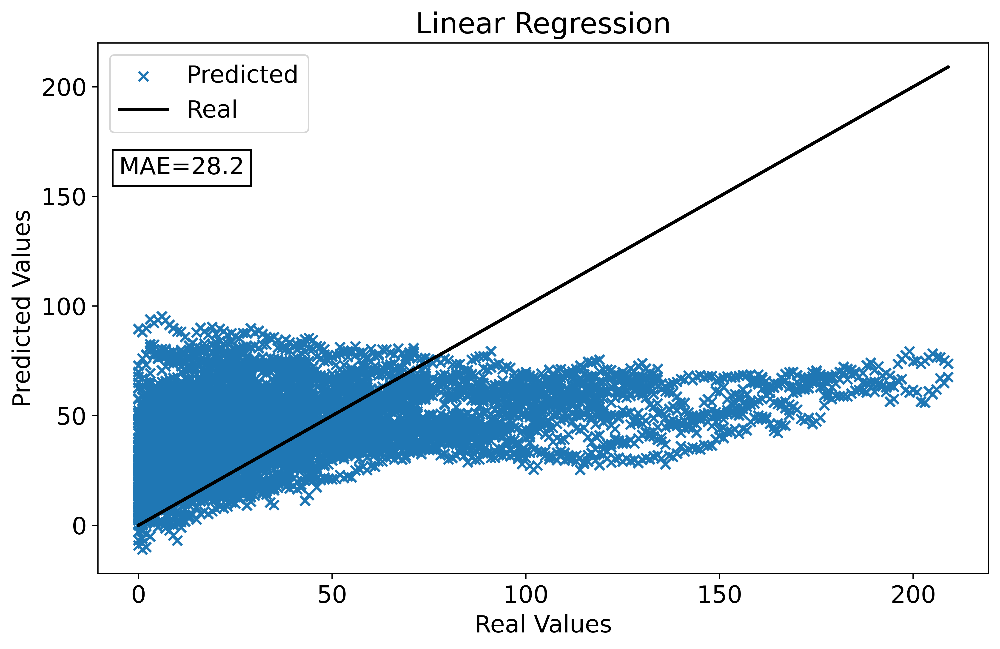

In [ ]:
# =============================================================================
# Linear Regression
# =============================================================================
LR=LinearRegression()
LR.fit(X_train,y_train)
PRUL_LR = LR.predict(X_test)
M1_PRUL_LR = LR.predict(X_M1)
M11_PRUL_LR = LR.predict(X_M11)
M22_PRUL_LR = LR.predict(X_M22)
M28_PRUL_LR = LR.predict(X_M28)
M35_PRUL_LR = LR.predict(X_M35)
M71_PRUL_LR = LR.predict(X_M71)

# =============================================================================
# Evaluation using MAE
# =============================================================================

MAE_LR = round(mean_absolute_error(y_test,PRUL_LR),1)
MAE_M1_LR = round(mean_absolute_error(y_M1,M1_PRUL_LR),1)
MAE_M11_LR = round(mean_absolute_error(y_M11,M11_PRUL_LR),1)
MAE_M22_LR = round(mean_absolute_error(y_M22,M22_PRUL_LR),1)
MAE_M28_LR = round(mean_absolute_error(y_M28,M28_PRUL_LR),1)
MAE_M35_LR = round(mean_absolute_error(y_M35,M35_PRUL_LR),1)
MAE_M71_LR = round(mean_absolute_error(y_M71,M71_PRUL_LR),1)


print('Total Linear Regression MAE = ',mean_absolute_error(y_test,PRUL_LR))
print("Total Linear Regression MSE =",mean_squared_error(y_test,PRUL_LR))

print('M1 Linear Regression MAE = ',mean_absolute_error(y_M1,M1_PRUL_LR))
print("M1 Linear Regression MSE =",mean_squared_error(y_M1,M1_PRUL_LR))

print('M11 Linear Regression MAE = ',mean_absolute_error(y_M11,M11_PRUL_LR))
print("M11 Linear Regression MSE =",mean_squared_error(y_M11,M11_PRUL_LR))

print('M22 Linear Regression MAE = ',mean_absolute_error(y_M22,M22_PRUL_LR))
print("M22 Linear Regression MSE =",mean_squared_error(y_M22,M22_PRUL_LR))

print('M28 Linear Regression MAE = ',mean_absolute_error(y_M28,M28_PRUL_LR))
print("M28 Linear Regression MSE =",mean_squared_error(y_M28,M28_PRUL_LR))

print('M35 Linear Regression MAE = ',mean_absolute_error(y_M35,M35_PRUL_LR))
print("M35 Linear Regression MSE =",mean_squared_error(y_M35,M35_PRUL_LR))

print('M71 Linear Regression MAE = ',mean_absolute_error(y_M71,M71_PRUL_LR))
print("M71 Linear Regression MSE =",mean_squared_error(y_M71,M71_PRUL_LR))


font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)
plt.figure(figsize=(10,6),dpi=500)
plt.scatter(y_test, PRUL_LR,marker="x",label='Predicted')
plt.plot(y_test, y_test,color='black',linewidth=2,label='Real')  # Plotting the y=x line for reference
plt.title('Linear Regression')
plt.xlabel('Real Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.text(-5,160, f'MAE={MAE_LR}', bbox=dict(facecolor='white', alpha=1))
plt.show()

In [ ]:
font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)

plt.figure(figsize=(23,13),dpi=500)


plt.subplot(231)
plt.plot(y_M11,'black',linewidth=3)
plt.plot(M11_PRUL_LR,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M11_LR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 11')

plt.subplot(232)
plt.plot(y_M1,'black',linewidth=3,label='Real RUL')
plt.plot(M1_PRUL_LR,linewidth=3,label='Predicted RUL')
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M1_LR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 1')

plt.subplot(233)
plt.plot(y_M22,'black',linewidth=3)
plt.plot(M22_PRUL_LR,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M22_LR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine22')

plt.subplot(234)
plt.plot(y_M28,'black',linewidth=3)
plt.plot(M28_PRUL_LR,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M28_LR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 28')

plt.subplot(235)
plt.plot(y_M35,'black',linewidth=3)
plt.plot(M35_PRUL_LR,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M35_LR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 35')

plt.subplot(236)
plt.plot(y_M71,'black',linewidth=3)
plt.plot(M71_PRUL_LR,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M71_LR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 71')

plt.figlegend(loc = 'lower center', ncol=3, fontsize=20)
plt.suptitle('Linear Regression', fontsize=40)
plt.show()

Total SVR MAE =  26.62135955484161
Total SVR MSE = 1524.8738175561753
M1 SVR MAE =  17.741309329784073
M1 SVR MSE = 420.0572051492102
M11 SVR MAE =  58.18041163688558
M11 SVR MSE = 4747.891048058399
M22 SVR MAE =  10.215314548639357
M22 SVR MSE = 133.67452179511764
M28 SVR MAE =  39.39484776430943
M28 SVR MSE = 2161.6035030322732
M35 SVR MAE =  13.196372116148776
M35 SVR MSE = 251.3139397894269
M71 SVR MAE =  14.750355335828472
M71 SVR MSE = 264.23311278812986


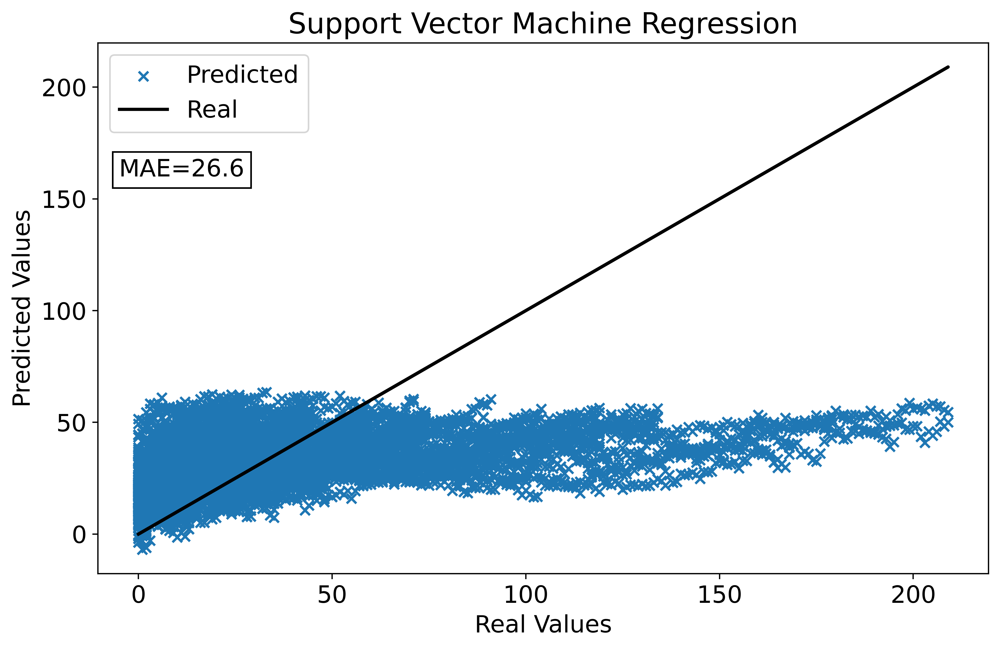

In [ ]:
# =============================================================================
# Support Vector Machine Regression
# =============================================================================
svr = SVR(kernel='linear')
svr.fit(X_train,y_train)
PRUL_SVR = svr.predict(X_test)
M1_PRUL_SVR = svr.predict(X_M1)
M11_PRUL_SVR = svr.predict(X_M11)
M22_PRUL_SVR = svr.predict(X_M22)
M28_PRUL_SVR = svr.predict(X_M28)
M35_PRUL_SVR = svr.predict(X_M35)
M71_PRUL_SVR = svr.predict(X_M71)

MAE_SVR = round(mean_absolute_error(y_test,PRUL_SVR),1)
MAE_M1_SVR = round(mean_absolute_error(y_M1,M1_PRUL_SVR),1)
MAE_M11_SVR = round(mean_absolute_error(y_M11,M11_PRUL_SVR),1)
MAE_M22_SVR = round(mean_absolute_error(y_M22,M22_PRUL_SVR),1)
MAE_M28_SVR = round(mean_absolute_error(y_M28,M28_PRUL_SVR),1)
MAE_M35_SVR = round(mean_absolute_error(y_M35,M35_PRUL_SVR),1)
MAE_M71_SVR = round(mean_absolute_error(y_M71,M71_PRUL_SVR),1)

print('Total SVR MAE = ',mean_absolute_error(y_test,PRUL_SVR))
print("Total SVR MSE =",mean_squared_error(y_test,PRUL_SVR))

print('M1 SVR MAE = ',mean_absolute_error(y_M1,M1_PRUL_SVR))
print("M1 SVR MSE =",mean_squared_error(y_M1,M1_PRUL_SVR))

print('M11 SVR MAE = ',mean_absolute_error(y_M11,M11_PRUL_SVR))
print("M11 SVR MSE =",mean_squared_error(y_M11,M11_PRUL_SVR))

print('M22 SVR MAE = ',mean_absolute_error(y_M22,M22_PRUL_SVR))
print("M22 SVR MSE =",mean_squared_error(y_M22,M22_PRUL_SVR))

print('M28 SVR MAE = ',mean_absolute_error(y_M28,M28_PRUL_SVR))
print("M28 SVR MSE =",mean_squared_error(y_M28,M28_PRUL_SVR))

print('M35 SVR MAE = ',mean_absolute_error(y_M35,M35_PRUL_SVR))
print("M35 SVR MSE =",mean_squared_error(y_M35,M35_PRUL_SVR))

print('M71 SVR MAE = ',mean_absolute_error(y_M71,M71_PRUL_SVR))
print("M71 SVR MSE =",mean_squared_error(y_M71,M71_PRUL_SVR))

font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)
plt.figure(figsize=(10,6),dpi=500)
plt.scatter(y_test, PRUL_SVR,marker="x",label='Predicted')
plt.plot(y_test, y_test,color='black',linewidth=2,label='Real')  # Plotting the y=x line for reference
plt.title('Support Vector Machine Regression')
plt.xlabel('Real Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.text(-5,160, f'MAE={MAE_SVR}', bbox=dict(facecolor='white', alpha=1))
plt.show()

In [ ]:
font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)

plt.figure(figsize=(23,13),dpi=500)

plt.subplot(231)
plt.plot(y_M11,'black',linewidth=3,label='Real RUL')
plt.plot(M11_PRUL_SVR,linewidth=3,label='Predicted RUL')
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M11_SVR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 11')

plt.subplot(232)
plt.plot(y_M1,'black',linewidth=3)
plt.plot(M1_PRUL_SVR,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M1_SVR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 1')

plt.subplot(233)
plt.plot(y_M22,'black',linewidth=3)
plt.plot(M22_PRUL_SVR,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M22_SVR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 22')

plt.subplot(234)
plt.plot(y_M28,'black',linewidth=3)
plt.plot(M28_PRUL_SVR,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M28_SVR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 28')

plt.subplot(235)
plt.plot(y_M35,'black',linewidth=3)
plt.plot(M35_PRUL_SVR,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M35_SVR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 35')

plt.subplot(236)
plt.plot(y_M71,'black',linewidth=3)
plt.plot(M71_PRUL_SVR,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M71_SVR}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 71')

plt.figlegend(loc = 'lower center', ncol=3,fontsize=20)
plt.suptitle('Support Vector Machine Regression', fontsize=40)
plt.show()

Total RF MAE =  26.330421477256923
Total RF MSE = 1282.2518736959244
M1 RF MAE =  37.04533333333333
M1 RF MSE = 2331.1376
M11 RF MAE =  43.04
M11 RF MSE = 2929.9517575757573
M22 RF MAE =  38.85777777777778
M22 RF MSE = 2371.634222222222
M28 RF MAE =  18.714814814814815
M28 RF MSE = 655.2978518518519
M35 RF MAE =  30.100000000000005
M35 RF MSE = 1501.901
M71 RF MAE =  64.4
M71 RF MSE = 5864.377333333334


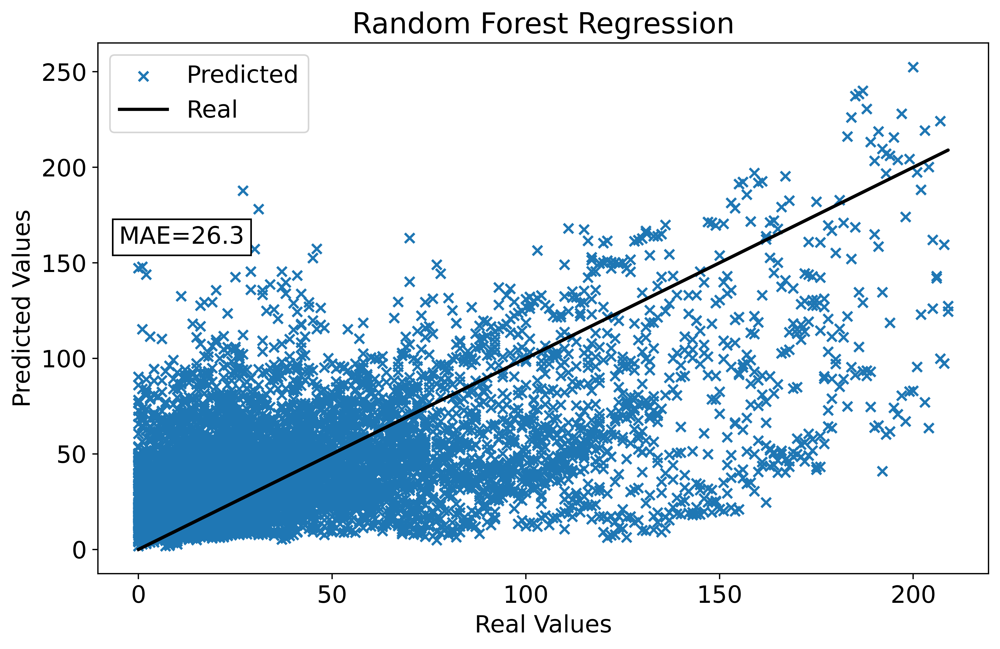

In [ ]:
# =============================================================================
# Random Forest Regression
# =============================================================================

RF = RandomForestRegressor(n_estimators=10, random_state=0, oob_score=True)
RF.fit(X_train,y_train)
PRUL_RF = RF.predict(X_test)
M1_PRUL_RF = RF.predict(X_M1)
M11_PRUL_RF = RF.predict(X_M11)
M22_PRUL_RF = RF.predict(X_M22)
M28_PRUL_RF = RF.predict(X_M28)
M35_PRUL_RF = RF.predict(X_M35)
M71_PRUL_RF = RF.predict(X_M71)

MAE_RF = round(mean_absolute_error(y_test,PRUL_RF),1)
MAE_M1_RF = round(mean_absolute_error(y_M1,M1_PRUL_RF),1)
MAE_M11_RF = round(mean_absolute_error(y_M11,M11_PRUL_RF),1)
MAE_M22_RF = round(mean_absolute_error(y_M22,M22_PRUL_RF),1)
MAE_M28_RF = round(mean_absolute_error(y_M28,M28_PRUL_RF),1)
MAE_M35_RF = round(mean_absolute_error(y_M35,M35_PRUL_RF),1)
MAE_M71_RF = round(mean_absolute_error(y_M71,M71_PRUL_RF),1)


print('Total RF MAE = ',mean_absolute_error(y_test,PRUL_RF))
print("Total RF MSE =",mean_squared_error(y_test,PRUL_RF))

print('M1 RF MAE = ',mean_absolute_error(y_M1,M1_PRUL_RF))
print("M1 RF MSE =",mean_squared_error(y_M1,M1_PRUL_RF))

print('M11 RF MAE = ',mean_absolute_error(y_M11,M11_PRUL_RF))
print("M11 RF MSE =",mean_squared_error(y_M11,M11_PRUL_RF))

print('M22 RF MAE = ',mean_absolute_error(y_M22,M22_PRUL_RF))
print("M22 RF MSE =",mean_squared_error(y_M22,M22_PRUL_RF))

print('M28 RF MAE = ',mean_absolute_error(y_M28,M28_PRUL_RF))
print("M28 RF MSE =",mean_squared_error(y_M28,M28_PRUL_RF))

print('M35 RF MAE = ',mean_absolute_error(y_M35,M35_PRUL_RF))
print("M35 RF MSE =",mean_squared_error(y_M35,M35_PRUL_RF))

print('M71 RF MAE = ',mean_absolute_error(y_M71,M71_PRUL_RF))
print("M71 RF MSE =",mean_squared_error(y_M71,M71_PRUL_RF))

font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)
plt.figure(figsize=(10,6),dpi=500)
plt.scatter(y_test, PRUL_RF,marker="x",label='Predicted')
plt.plot(y_test, y_test,color='black',linewidth=2,label='Real')  # Plotting the y=x line for reference
plt.title('Random Forest Regression')
plt.xlabel('Real Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.text(-5,160, f'MAE={MAE_RF}', bbox=dict(facecolor='white', alpha=1))
plt.show()

In [ ]:
font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)

plt.figure(figsize=(23,13),dpi=500)


plt.subplot(231)
plt.plot(y_M11,'black',linewidth=3)
plt.plot(M11_PRUL_RF,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M11_RF}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 11')

plt.subplot(232)
plt.plot(y_M1,'black',linewidth=3,label='Real RUL')
plt.plot(M1_PRUL_RF,linewidth=3,label='Predicted RUL')
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M1_RF}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 1')

plt.subplot(233)
plt.plot(y_M22,'black',linewidth=3)
plt.plot(M22_PRUL_RF,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M22_RF}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine22')

plt.subplot(234)
plt.plot(y_M28,'black',linewidth=3)
plt.plot(M28_PRUL_RF,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M28_RF}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 28')

plt.subplot(235)
plt.plot(y_M35,'black',linewidth=3)
plt.plot(M35_PRUL_RF,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M35_RF}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 35')

plt.subplot(236)
plt.plot(y_M71,'black',linewidth=3)
plt.plot(M71_PRUL_RF,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M71_RF}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 71')

plt.figlegend(loc = 'lower center', ncol=3, fontsize=20)
plt.suptitle('Random Forest Regression', fontsize=40)
plt.show()

Total XGB MAE =  24.284681541154193
Total XGB MSE = 1074.4742166086337
M1 XGB MAE =  37.404993794759115
M1 XGB MSE = 2382.5390453927116
M11 XGB MAE =  48.83537322535659
M11 XGB MSE = 3585.1964866719914
M22 XGB MAE =  30.12455588446723
M22 XGB MSE = 1044.2070924002473
M28 XGB MAE =  18.953306445369012
M28 XGB MSE = 682.6042206951679
M35 XGB MAE =  24.221647771199546
M35 XGB MSE = 790.6511066358047
M71 XGB MAE =  54.85950558980306
M71 XGB MSE = 3913.0234820786363


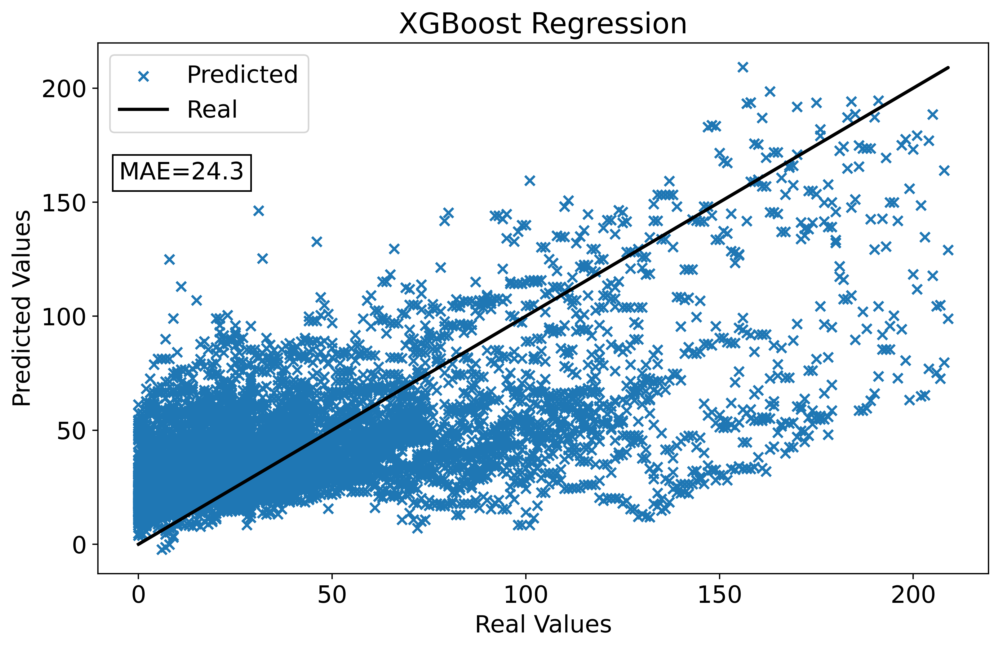

In [ ]:
# =============================================================================
# XGBoost
# =============================================================================

XGB = XGBRegressor(n_estimators=10, random_state=0, oob_score=True)
XGB.fit(X_train,y_train)
PRUL_XGB = XGB.predict(X_test)
M1_PRUL_XGB = XGB.predict(X_M1)
M11_PRUL_XGB = XGB.predict(X_M11)
M22_PRUL_XGB = XGB.predict(X_M22)
M28_PRUL_XGB = XGB.predict(X_M28)
M35_PRUL_XGB = XGB.predict(X_M35)
M71_PRUL_XGB = XGB.predict(X_M71)

MAE_XGB = round(mean_absolute_error(y_test,PRUL_XGB),1)
MAE_M1_XGB = round(mean_absolute_error(y_M1,M1_PRUL_XGB),1)
MAE_M11_XGB = round(mean_absolute_error(y_M11,M11_PRUL_XGB),1)
MAE_M22_XGB = round(mean_absolute_error(y_M22,M22_PRUL_XGB),1)
MAE_M28_XGB = round(mean_absolute_error(y_M28,M28_PRUL_XGB),1)
MAE_M35_XGB = round(mean_absolute_error(y_M35,M35_PRUL_XGB),1)
MAE_M71_XGB = round(mean_absolute_error(y_M71,M71_PRUL_XGB),1)

print('Total XGB MAE = ',mean_absolute_error(y_test,PRUL_XGB))
print("Total XGB MSE =",mean_squared_error(y_test,PRUL_XGB))

print('M1 XGB MAE = ',mean_absolute_error(y_M1,M1_PRUL_XGB))
print("M1 XGB MSE =",mean_squared_error(y_M1,M1_PRUL_XGB))

print('M11 XGB MAE = ',mean_absolute_error(y_M11,M11_PRUL_XGB))
print("M11 XGB MSE =",mean_squared_error(y_M11,M11_PRUL_XGB))

print('M22 XGB MAE = ',mean_absolute_error(y_M22,M22_PRUL_XGB))
print("M22 XGB MSE =",mean_squared_error(y_M22,M22_PRUL_XGB))

print('M28 XGB MAE = ',mean_absolute_error(y_M28,M28_PRUL_XGB))
print("M28 XGB MSE =",mean_squared_error(y_M28,M28_PRUL_XGB))

print('M35 XGB MAE = ',mean_absolute_error(y_M35,M35_PRUL_XGB))
print("M35 XGB MSE =",mean_squared_error(y_M35,M35_PRUL_XGB))

print('M71 XGB MAE = ',mean_absolute_error(y_M71,M71_PRUL_XGB))
print("M71 XGB MSE =",mean_squared_error(y_M71,M71_PRUL_XGB))

font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)
plt.figure(figsize=(10,6),dpi=500)
plt.scatter(y_test, PRUL_XGB,marker="x",label='Predicted')
plt.plot(y_test, y_test,color='black',linewidth=2,label='Real')  # Plotting the y=x line for reference
plt.title('XGBoost Regression')
plt.xlabel('Real Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.text(-5,160, f'MAE={MAE_XGB}', bbox=dict(facecolor='white', alpha=1))
plt.show()

In [ ]:
font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)

plt.figure(figsize=(23,13),dpi=500)

plt.subplot(231)
plt.plot(y_M11,'black',linewidth=3,label='Real RUL')
plt.plot(M11_PRUL_XGB,linewidth=3,label='Predicted RUL')
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M11_XGB}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 11')

plt.subplot(232)
plt.plot(y_M1,'black',linewidth=3)
plt.plot(M1_PRUL_XGB,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M1_XGB}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 1')

plt.subplot(233)
plt.plot(y_M22,'black',linewidth=3)
plt.plot(M22_PRUL_XGB,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M22_XGB}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 22')

plt.subplot(234)
plt.plot(y_M28,'black',linewidth=3)
plt.plot(M28_PRUL_XGB,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M28_XGB}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 28')

plt.subplot(235)
plt.plot(y_M35,'black',linewidth=3)
plt.plot(M35_PRUL_XGB,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M35_XGB}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 35')

plt.subplot(236)
plt.plot(y_M71,'black',linewidth=3)
plt.plot(M71_PRUL_XGB,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M71_XGB}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 71')

plt.figlegend(loc = 'lower center', ncol=3,fontsize=20)
plt.suptitle('XGBoost Regression', fontsize=40)
plt.show()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               5376      
                                                                 
 dense_1 (Dense)             (None, 512)               131584    
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dense_3 (Dense)             (None, 256)               65792     
                                                                 
 dense_4 (Dense)             (None, 1)                 257       
                                                                 
Total params: 334337 (1.28 MB)
Trainable params: 334337 (1.28 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/100
522/522 

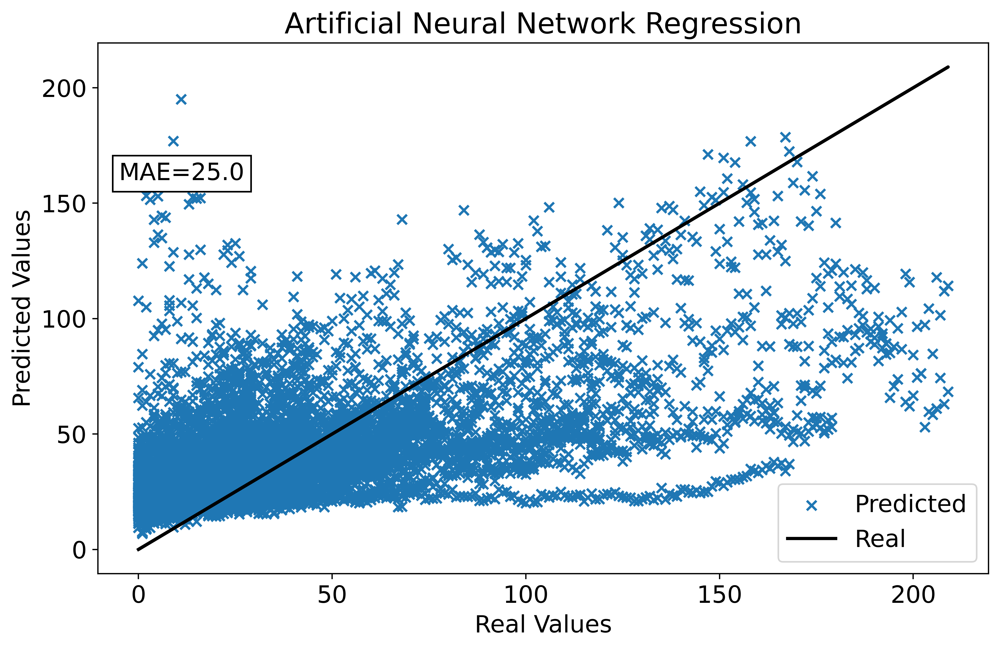

In [ ]:
# =============================================================================
# Neural Network
# =============================================================================

drop=0.05
ANN = Sequential ()

ANN.add(Dense(256, input_dim=20, activation='relu')) #FIX DIM
#ANN.add(Dropout(drop))
ANN.add(Dense(512, activation='relu'))
ANN.add(Dense(256, activation='relu'))
#ANN.add(Dropout(drop))
ANN.add(Dense(256, activation='relu'))
#ANN.add(Dropout(drop))
ANN.add(Dense(1, activation='linear'))
CP = ModelCheckpoint('ANN/', save_best_only=True)
ANN.compile(loss='mse', optimizer='adam', metrics='mse')
ANN.summary()

ANN.fit(X_train,y_train,validation_split=0.2,callbacks=[CP],epochs=100)

ANN = load_model('ANN/')

PRUL_ANN = ANN.predict(X_test)
M1_PRUL_ANN = ANN.predict(X_M1)
M11_PRUL_ANN = ANN.predict(X_M11)
M22_PRUL_ANN = ANN.predict(X_M22)
M28_PRUL_ANN = ANN.predict(X_M28)
M35_PRUL_ANN = ANN.predict(X_M35)
M71_PRUL_ANN = ANN.predict(X_M71)

MAE_ANN = round(mean_absolute_error(y_test,PRUL_ANN),1)
MAE_M1_ANN = round(mean_absolute_error(y_M1,M1_PRUL_ANN),1)
MAE_M11_ANN = round(mean_absolute_error(y_M11,M11_PRUL_ANN),1)
MAE_M22_ANN = round(mean_absolute_error(y_M22,M22_PRUL_ANN),1)
MAE_M28_ANN = round(mean_absolute_error(y_M28,M28_PRUL_ANN),1)
MAE_M35_ANN = round(mean_absolute_error(y_M35,M35_PRUL_ANN),1)
MAE_M71_ANN = round(mean_absolute_error(y_M71,M71_PRUL_ANN),1)

print('Total ANN MAE = ',mean_absolute_error(y_test,PRUL_ANN))
print("Total ANN MSE =",mean_squared_error(y_test,PRUL_ANN))

print('M1 ANN MAE = ',mean_absolute_error(y_M1,M1_PRUL_ANN))
print("M1 ANN MSE =",mean_squared_error(y_M1,M1_PRUL_ANN))

print('M11 ANN MAE = ',mean_absolute_error(y_M11,M11_PRUL_ANN))
print("M11 ANN MSE =",mean_squared_error(y_M11,M11_PRUL_ANN))

print('M22 ANN MAE = ',mean_absolute_error(y_M22,M22_PRUL_ANN))
print("M22 ANN MSE =",mean_squared_error(y_M22,M22_PRUL_ANN))

print('M28 ANN MAE = ',mean_absolute_error(y_M28,M28_PRUL_ANN))
print("M28 ANN MSE =",mean_squared_error(y_M28,M28_PRUL_ANN))

print('M35 ANN MAE = ',mean_absolute_error(y_M35,M35_PRUL_ANN))
print("M35 ANN MSE =",mean_squared_error(y_M35,M35_PRUL_ANN))

print('M71 ANN MAE = ',mean_absolute_error(y_M71,M71_PRUL_ANN))
print("M71 ANN MSE =",mean_squared_error(y_M71,M71_PRUL_ANN))

font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)
plt.figure(figsize=(10,6),dpi=500)
plt.scatter(y_test, PRUL_ANN,marker="x",label='Predicted')
plt.plot(y_test, y_test,color='black',linewidth=2,label='Real')  # Plotting the y=x line for reference
plt.title('Artificial Neural Network Regression')
plt.xlabel('Real Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.text(-5,160, f'MAE={MAE_ANN}', bbox=dict(facecolor='white', alpha=1))
plt.show()

In [ ]:
font = {'weight':'normal',
        'size':15}
plt.rc('font', **font)

plt.figure(figsize=(23,13),dpi=500)

plt.subplot(231)
plt.plot(y_M11,'black',linewidth=3,label='Real RUL')
plt.plot(M11_PRUL_ANN,linewidth=3,label='Predicted RUL')
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M11_ANN}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 11')

plt.subplot(232)
plt.plot(y_M1,'black',linewidth=3)
plt.plot(M1_PRUL_ANN,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M1_ANN}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 1')

plt.subplot(233)
plt.plot(y_M22,'black',linewidth=3)
plt.plot(M22_PRUL_ANN,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M22_ANN}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 22')

plt.subplot(234)
plt.plot(y_M28,'black',linewidth=3)
plt.plot(M28_PRUL_ANN,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M28_ANN}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 28')

plt.subplot(235)
plt.plot(y_M35,'black',linewidth=3)
plt.plot(M35_PRUL_ANN,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M35_ANN}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 35')

plt.subplot(236)
plt.plot(y_M71,'black',linewidth=3)
plt.plot(M71_PRUL_ANN,linewidth=3)
plt.xlabel('Time (Days)')
plt.ylabel('RUL')
plt.text(0, 0, f'MAE={MAE_M71_ANN}', bbox=dict(facecolor='white', alpha=1))
plt.title('Machine 71')

plt.figlegend(loc = 'lower center', ncol=3,fontsize=20)
plt.suptitle('Artificial Neural Network Regression', fontsize=40)
plt.show()